# Manual temporal GNN using PyG

This script will be turned in with my Machine Learning class report, Dec 10, 2025.

### Data generation code

In [1]:
import torch
from torch_geometric.data import Data, Dataset


class SlidingWindowTemporalDataset(Dataset):
    """
    General-purpose sliding window dataset for temporal graph data.

    Parameters
    ----------
    Ca : array-like, shape (N, T)
        Node values over time. Can be numpy array or torch tensor.
        N = number of nodes, T = number of timepoints.
    edge_index : torch.LongTensor, shape (2, E)
        Graph connectivity (same for all timesteps).
    in_window : int, default=1
        Number of past timepoints to use as input (window size).
    horizon : int, default=1
        How many steps ahead of the LAST input frame to start predicting.
        Example: in_window=5, horizon=1:
            x uses t .. t+4, y starts at t+5.
    out_window : int, default=1
        Number of future timepoints to predict.
        out_window=1 → single-step target
        out_window>1 → sequence-to-sequence target.
    """

    def __init__(self, Ca, edge_index, in_window=1, horizon=1, out_window=1):
        super().__init__()

        # Ensure tensor, keep as float
        self.Ca = torch.as_tensor(Ca, dtype=torch.float)  # (N, T)
        self.edge_index = edge_index

        assert self.Ca.ndim == 2, "Ca must have shape (N, T)"
        self.N, self.T = self.Ca.shape

        self.in_window = int(in_window)
        self.horizon = int(horizon)
        self.out_window = int(out_window)

        assert self.in_window >= 1
        assert self.horizon >= 1
        assert self.out_window >= 1

        # How many samples can we make?
        # idx is the *start index* of the input window.
        #
        # Input uses       [idx, ..., idx + in_window - 1]
        # Last input idx = idx + in_window - 1
        # First target    = last_input + horizon
        #                = idx + in_window - 1 + horizon
        # Last target     = first_target + out_window - 1
        #                = idx + in_window - 1 + horizon + out_window - 1
        #
        # Require last_target <= T - 1
        # => idx <= T - (in_window + horizon + out_window) + 1
        self._max_start_idx = (
            self.T - (self.in_window + self.horizon + self.out_window) + 1
        )
        if self._max_start_idx <= 0:
            raise ValueError(
                f"Not enough timepoints T={self.T} for "
                f"in_window={self.in_window}, horizon={self.horizon}, out_window={self.out_window}"
            )

    def len(self):
        # Number of valid window starts
        return self._max_start_idx

    def get(self, idx):
        """
        idx: integer in [0, len(self)-1]
        Defines the *start* of the input window.
        """
        if idx < 0 or idx >= self.len():
            raise IndexError(f"Index {idx} out of range for dataset of length {self.len()}")

        # Input window: [idx, ..., idx + in_window - 1]
        x_start = idx
        x_end = idx + self.in_window  # slicing is exclusive, so this is +in_window

        # Target window:
        # first target index = last_input + horizon
        y_start = (idx + self.in_window - 1) + self.horizon
        y_end = y_start + self.out_window

        # Shapes:
        # x: (N, in_window)
        # y: (N, out_window)
        x = self.Ca[:, x_start:x_end]
        y = self.Ca[:, y_start:y_end]

        return Data(
            x=x,                 # (N, in_window)
            y=y,                 # (N, out_window)
            edge_index=self.edge_index
        )



# Pipeline

## Load datasets

In [2]:
import os
# Data folder path
data_path = r'/Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/usable_12012025_torch'

options = [111, 515, 10110, 50150, 1001100, 10001500]
files_111 = []
files_515 = []
files_10110 = []
files_50150 = []
files_1001100 = []
files_10001500 = []

data_path_files = sorted(os.listdir(data_path))
print(f"Found {len(data_path_files)} files in data path.")
for opt in options:
    matching_files = [f for f in data_path_files if f.endswith(f'{opt}.pt')]
    print(f"Option {opt}: Found {len(matching_files)} matching files.")
    # Load in matching files
    for file in matching_files:
        file_path = os.path.join(data_path, file)
        dataset = torch.load(file_path)
        # Add to list containing option
        if opt == 111:
            files_111.append(dataset)
        elif opt == 515:
            files_515.append(dataset)
        elif opt == 10110:
            files_10110.append(dataset)
        elif opt == 50150:
            files_50150.append(dataset)
        elif opt == 1001100:
            files_1001100.append(dataset)
        elif opt == 10001500:
            files_10001500.append(dataset)
        print(f"Loaded dataset from {file_path} with {len(dataset)} samples.")






Found 132 files in data path.
Option 111: Found 22 matching files.
Loaded dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/usable_12012025_torch/ca_model_dense_base_12345_20251202-011114_PyGT_dataset_111.pt with 3598 samples.
Loaded dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/usable_12012025_torch/ca_model_dense_base_1234_20251202-011213_PyGT_dataset_111.pt with 3598 samples.
Loaded dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/usable_12012025_torch/ca_model_dense_base_123567_20251202-011302_PyGT_dataset_111.pt with 3598 samples.
Loaded dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/usable_12012025_torch/ca_model_dense_base_123_20251202-011242_PyGT_dataset_111.p

/var/folders/v2/s6clf_y12bjd0pq98kr66skw0000gs/T/ipykernel_67188/2699830561.py:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  dataset = torch.load(file_path)


Loaded dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/usable_12012025_torch/ca_model_dense_base_123567_20251202-011302_PyGT_dataset_10001500.pt with 2100 samples.
Loaded dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/usable_12012025_torch/ca_model_dense_base_123_20251202-011242_PyGT_dataset_10001500.pt with 2100 samples.
Loaded dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/usable_12012025_torch/ca_model_dense_base_42_20251202-011535_PyGT_dataset_10001500.pt with 2100 samples.
Loaded dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/usable_12012025_torch/ca_model_dense_base_528491_20251202-011331_PyGT_dataset_10001500.pt with 2100 samples.
Loaded dataset from /Users/

In [3]:
data_path2 = r'/Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/round2_120225_torch_seed_528491'
# Load datasets from round 2
data_path2_files = sorted(os.listdir(data_path2))
files_111_round2 = []
for file in data_path2_files:
    if file.endswith('111.pt'):
        file_path = os.path.join(data_path2, file)
        dataset = torch.load(file_path)
        files_111_round2.append(dataset)
        print(f"Loaded round 2 dataset from {file_path} with {len(dataset)} samples.")

Loaded round 2 dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/round2_120225_torch_seed_528491/ca_model_dense_base_528491_20251202-180135_PyGT_dataset_111.pt with 3598 samples.
Loaded round 2 dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/round2_120225_torch_seed_528491/ca_model_dense_sim10_20251202-180135_PyGT_dataset_111.pt with 3598 samples.
Loaded round 2 dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/round2_120225_torch_seed_528491/ca_model_dense_sim11_20251202-180135_PyGT_dataset_111.pt with 3598 samples.
Loaded round 2 dataset from /Users/scini/Library/CloudStorage/Box-Box/ZartmanLabGroupFolder/Zartman_Dowling/Stephen/MC2021_Data/ML_data_gen_CRC/round2_120225_torch_seed_528491/ca_model_dense_sim12_20251202-180135_PyGT_dataset_111.pt with 

/var/folders/v2/s6clf_y12bjd0pq98kr66skw0000gs/T/ipykernel_67188/1534537595.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  dataset = torch.load(file_path)


# Rolling window, multi-dataset model testing

In [4]:
import torch
import torch.nn as nn
from torch_geometric.nn import SAGEConv


class SAGE_GRU_Autoregressive_RW(nn.Module):
    def __init__(self, in_channels=1, hidden_channels=32, out_window=1):
        """
        Parameters
        ----------
        in_channels : int
            Number of input features per node. For your rolling-window setup,
            this will usually be `in_window` (number of past frames).
        hidden_channels : int
            Hidden dimension for GraphSAGE and GRU.
        out_window : int
            Number of future timepoints to predict per node. For your dataset,
            this should match `out_window` in the SlidingWindowTemporalDataset.
        """
        super().__init__()

        # Spatial aggregator (GraphSAGE) over the current window features
        self.sage = SAGEConv(in_channels, hidden_channels)

        # Temporal recurrence per node.
        # We treat EACH NODE as a batch element:
        #   input to GRU:  (seq_len = 1, batch = N, features = H)
        self.gru = nn.GRU(
            input_size=hidden_channels,
            hidden_size=hidden_channels,
            batch_first=False  # input: (seq_len, batch, feature)
        )

        # Decoder: hidden state -> out_window future frames per node
        # If out_window = 1, this is just next-step prediction.
        self.lin = nn.Linear(hidden_channels, out_window)

        self.hidden_channels = hidden_channels
        self.out_window = out_window

    def forward(self, x_t, edge_index, h):
        """
        Parameters
        ----------
        x_t : torch.Tensor
            Node features at the current rolling window.
            Shape: (N, in_channels)  where in_channels = in_window (or other feature dim).
        edge_index : torch.LongTensor
            Graph edges (2, E).
        h : torch.Tensor
            GRU hidden state, shape (1, N, hidden_channels).

        Returns
        -------
        pred : torch.Tensor
            Predicted future window per node.
            Shape: (N, out_window)
        h_new : torch.Tensor
            Updated hidden state, shape (1, N, hidden_channels).
        """

        # --- 1) Spatial message passing over the current window ---
        # x_t: (N, in_channels)
        g = self.sage(x_t, edge_index)   # (N, hidden_channels)
        g = torch.relu(g)

        # --- 2) GRU expects (seq_len, batch, feature) because batch_first=False ---
        # We treat each node as a "batch element" and this whole window as a single time step.
        g_seq = g.unsqueeze(0)           # (1, N, hidden_channels)

        out, h_new = self.gru(g_seq, h)  # out: (1, N, hidden_channels)

        # --- 3) Decode to out_window future frames per node ---
        out_last = out.squeeze(0)        # (N, hidden_channels)
        pred = self.lin(out_last)        # (N, out_window)

        return pred, h_new

    def init_hidden(self, N, device=None):
        """
        Initialize GRU hidden state for N nodes.

        Shape: (num_layers=1, batch=N, hidden_dim)
        """
        if device is None:
            device = next(self.parameters()).device
        return torch.zeros(1, N, self.hidden_channels, device=device)


In [5]:
import torch
import torch.nn as nn
from torch_geometric.nn import SAGEConv, GCNConv


class GCNConv_GRU_Autoregressive_RW(nn.Module):
    def __init__(self, in_channels=1, hidden_channels=32, out_window=1):
        """
        Parameters
        ----------
        in_channels : int
            Number of input features per node. For your rolling-window setup,
            this will usually be `in_window` (number of past frames).
        hidden_channels : int
            Hidden dimension for GraphSAGE and GRU.
        out_window : int
            Number of future timepoints to predict per node. For your dataset,
            this should match `out_window` in the SlidingWindowTemporalDataset.
        """
        super().__init__()

        # Spatial aggregator (GraphSAGE) over the current window features
        self.GCN = GCNConv(in_channels, hidden_channels)

        # Temporal recurrence per node.
        # We treat EACH NODE as a batch element:
        #   input to GRU:  (seq_len = 1, batch = N, features = H)
        self.gru = nn.GRU(
            input_size=hidden_channels,
            hidden_size=hidden_channels,
            batch_first=False  # input: (seq_len, batch, feature)
        )

        # Decoder: hidden state -> out_window future frames per node
        # If out_window = 1, this is just next-step prediction.
        self.lin = nn.Linear(hidden_channels, out_window)

        self.hidden_channels = hidden_channels
        self.out_window = out_window

    def forward(self, x_t, edge_index, h):
        """
        Parameters
        ----------
        x_t : torch.Tensor
            Node features at the current rolling window.
            Shape: (N, in_channels)  where in_channels = in_window (or other feature dim).
        edge_index : torch.LongTensor
            Graph edges (2, E).
        h : torch.Tensor
            GRU hidden state, shape (1, N, hidden_channels).

        Returns
        -------
        pred : torch.Tensor
            Predicted future window per node.
            Shape: (N, out_window)
        h_new : torch.Tensor
            Updated hidden state, shape (1, N, hidden_channels).
        """

        # --- 1) Spatial message passing over the current window ---
        # x_t: (N, in_channels)
        g = self.GCN(x_t, edge_index)   # (N, hidden_channels)
        g = torch.relu(g)

        # --- 2) GRU expects (seq_len, batch, feature) because batch_first=False ---
        # We treat each node as a "batch element" and this whole window as a single time step.
        g_seq = g.unsqueeze(0)           # (1, N, hidden_channels)

        out, h_new = self.gru(g_seq, h)  # out: (1, N, hidden_channels)

        # --- 3) Decode to out_window future frames per node ---
        out_last = out.squeeze(0)        # (N, hidden_channels)
        pred = self.lin(out_last)        # (N, out_window)

        return pred, h_new

    def init_hidden(self, N, device=None):
        """
        Initialize GRU hidden state for N nodes.

        Shape: (num_layers=1, batch=N, hidden_dim)
        """
        if device is None:
            device = next(self.parameters()).device
        return torch.zeros(1, N, self.hidden_channels, device=device)


In [6]:
from torch_geometric.loader import DataLoader
import torch
import torch.nn as nn
import random

def train_model_RW_multi(model, datasets, epochs=50, lr=1e-3, device=None, shuffle_sims=True):
    """
    Training loop for rolling-window temporal GNN with GRU over MULTIPLE simulations.

    Parameters
    ----------
    model : nn.Module
        SAGE_GRU_Autoregressive_RW (or compatible) model.
    datasets : list
        List of SlidingWindowTemporalDataset objects.
        Each dataset corresponds to one simulation (one Ca(N,T) sequence).
    epochs : int
        Number of epochs.
    lr : float
        Learning rate.
    device : torch.device or None
        Device to train on.
    shuffle_sims : bool
        Whether to randomize the order of simulations each epoch.

    Returns
    -------
    loss_per_epoch : list of float
        Total MSE per epoch (summed over all sims).
    loss2_per_epoch : list of float
        Total L1 per epoch (summed over all sims).
    """

    if not isinstance(datasets, (list, tuple)):
        # If a single dataset is passed, wrap it
        datasets = [datasets]

    if device is None:
        device = next(model.parameters()).device
    model.to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    mse_loss = nn.MSELoss()
    l1_loss = nn.L1Loss()

    loss_per_epoch = []
    loss2_per_epoch = []

    for epoch in range(epochs):
        model.train()
        total_mse = 0.0
        total_l1 = 0.0

        # Optionally randomize order of simulations each epoch
        sim_list = list(datasets)
        if shuffle_sims:
            random.shuffle(sim_list)

        # ---- Loop over simulations ----
        for sim_ds in sim_list:
            # N: number of nodes for THIS simulation
            N = sim_ds.Ca.shape[0]

            # Fresh hidden state per simulation
            h = model.init_hidden(N, device=device)

            # Windows are already in temporal order; don't shuffle
            loader = DataLoader(sim_ds, batch_size=1, shuffle=False)

            # ---- Loop over rolling windows within this simulation ----
            for data in loader:
                x = data.x.to(device)              # (N, in_window)
                y = data.y.to(device)              # (N, out_window)
                edge_index = data.edge_index.to(device)

                # Forward: GRU carries hidden state across windows of THIS sim
                pred, h = model(x, edge_index, h)

                # Truncate backprop through time
                h = h.detach()

                # Loss over full future window
                loss = mse_loss(pred, y)
                loss_l1 = l1_loss(pred, y)

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                total_mse += loss.item()
                total_l1 += loss_l1.item()

        print(f"Epoch {epoch}: MSELoss = {total_mse:.6f}, L1Loss = {total_l1:.6f}")
        loss_per_epoch.append(total_mse)
        loss2_per_epoch.append(total_l1)

    return loss_per_epoch, loss2_per_epoch


In [7]:
import torch
import numpy as np

def autoregressive_rollout_RW(model, x0, edge_index, steps=200, device=None):
    """
    Autoregressive rollout for rolling-window GRU model.

    x0: tensor (N, in_window)
    edge_index: (2, E)
    steps: number of rollout steps
    """

    model.eval()

    if device is None:
        device = next(model.parameters()).device

    x_t = x0.to(device)
    edge_index = edge_index.to(device)

    # --- SHAPE CHECKS ---------------------------------------------------------
    if x_t.ndim != 2:
        raise ValueError(f"x0 must be 2D (N, in_window). Got shape {x_t.shape}.")

    N, in_window = x_t.shape

    # model must have out_window
    if not hasattr(model, "out_window"):
        raise ValueError("Model must define model.out_window for rolling-window rollout.")

    out_window = model.out_window
    # --------------------------------------------------------------------------

    # Initialize GRU hidden state
    h = model.init_hidden(N, device=device)

    preds = []

    with torch.no_grad():

        # ---------------- FIRST FORWARD PASS ----------------
        try:
            pred, h = model(x_t, edge_index, h)
        except Exception as e:
            raise RuntimeError(
                f"First forward pass failed. Check x0 shape. "
                f"x0 shape={x_t.shape}, expected (N, in_window)."
            ) from e

        preds.append(pred.detach().cpu().numpy())

        # ---------------- AUTOREGRESSIVE LOOP ---------------
        for step in range(steps):

            # Build next input window
            if in_window > out_window:
                x_t = torch.cat([x_t[:, out_window:], pred], dim=1)
            else:
                x_t = pred[:, -in_window:]

            # Next forward step
            try:
                pred, h = model(x_t, edge_index, h)
            except Exception as e:
                raise RuntimeError(
                    f"Forward pass failed at step {step}. "
                    f"x_t shape={x_t.shape}, expected (N, in_window)."
                ) from e

            preds.append(pred.detach().cpu().numpy())

    return np.stack(preds, axis=0)



In [8]:
from torch_geometric.loader import DataLoader
import torch

def evaluate_nextstep_RW(model, dataset, device=None):
    """
    Evaluate the model on a rolling-window dataset.
    
    Each dataset[i] contains:
        x : (N, in_window)
        y : (N, out_window)
    
    Returns:
        preds  : list of tensors, each (N, out_window)
        truths : list of tensors, each (N, out_window)
    """

    if device is None:
        device = next(model.parameters()).device

    loader = DataLoader(dataset, batch_size=1, shuffle=False)
    model.eval()

    N = dataset.Ca.shape[0]
    preds, truths = [], []

    # Hidden state reset ONCE for the whole sequence
    h = model.init_hidden(N, device=device)

    with torch.no_grad():
        for data in loader:

            x = data.x.to(device)             # (N, in_window)
            y = data.y.to(device)             # (N, out_window)
            edge_index = data.edge_index.to(device)

            # Forward step using the GRU memory
            pred, h = model(x, edge_index, h)

            # Detach state so memory persists, graph does not
            h = h.detach()

            # Store predictions and true values
            preds.append(pred.cpu())
            truths.append(y.cpu())

    return preds, truths


In [10]:
# Repeat in loop with bigger rolling windows and store results
in_window_sizes = [1, 5, 10, 5, 10, 25]
out_window_sizes = [1, 5, 10, 1, 1, 5]

training_set = files_111[1]
testing_set = files_111[10]

results = {}
for in_w, out_w in zip(in_window_sizes, out_window_sizes):
    print(f"Training rolling-window model with in_window={in_w}, out_window={out_w}")
    RW_training_dataset = SlidingWindowTemporalDataset(
        Ca=training_set.Ca.numpy(),
        edge_index=testing_set.edge_index,
        in_window=in_w,
        horizon=1,
        out_window=out_w
    )

    RW_testing_dataset = SlidingWindowTemporalDataset(
        Ca=testing_set.Ca.numpy(),
        edge_index=testing_set.edge_index,
        in_window=in_w,
        horizon=1,
        out_window=out_w
    )

    model_RW_loop = SAGE_GRU_Autoregressive_RW(in_channels=in_w, hidden_channels=32, out_window=out_w)
    RW_MSE_loop, RW_L1_loop = train_model_RW_multi(model_RW_loop, RW_training_dataset, epochs=50, lr=1e-3)

    # Evaluate
    RW_preds_list_loop, RW_truths_list_loop = evaluate_nextstep_RW(model_RW_loop, RW_testing_dataset)

    # Convert to arrays
    RW_truths_arr_loop = torch.stack([t for t in RW_truths_list_loop], dim=1).numpy()  # (N, T_test, out_window)
    RW_preds_arr_loop  = torch.stack([p for p in RW_preds_list_loop],  dim=1).numpy()  # (N, T_test, out_window)

    results[(in_w, out_w)] = {
        'model': model_RW_loop,
        'MSE_loss': RW_MSE_loop,
        'L1_loss': RW_L1_loop,
        'preds': RW_preds_arr_loop,
        'truths': RW_truths_arr_loop
    }


Training rolling-window model with in_window=1, out_window=1
Epoch 0: MSELoss = 0.405196, L1Loss = 9.838281
Epoch 1: MSELoss = 0.032971, L1Loss = 1.551221
Epoch 2: MSELoss = 0.028240, L1Loss = 1.335226
Epoch 3: MSELoss = 0.024493, L1Loss = 1.318946
Epoch 4: MSELoss = 0.021457, L1Loss = 1.231048
Epoch 5: MSELoss = 0.021618, L1Loss = 1.308060
Epoch 6: MSELoss = 0.018166, L1Loss = 1.381259
Epoch 7: MSELoss = 0.014472, L1Loss = 1.454733
Epoch 8: MSELoss = 0.011063, L1Loss = 1.347416
Epoch 9: MSELoss = 0.009148, L1Loss = 0.953175
Epoch 10: MSELoss = 0.006146, L1Loss = 0.849397
Epoch 11: MSELoss = 0.004097, L1Loss = 0.743984
Epoch 12: MSELoss = 0.003243, L1Loss = 0.778054
Epoch 13: MSELoss = 0.003438, L1Loss = 0.875267
Epoch 14: MSELoss = 0.003212, L1Loss = 0.816740
Epoch 15: MSELoss = 0.003649, L1Loss = 0.708185
Epoch 16: MSELoss = 0.002210, L1Loss = 0.595528
Epoch 17: MSELoss = 0.001829, L1Loss = 0.532551
Epoch 18: MSELoss = 0.002438, L1Loss = 0.658971
Epoch 19: MSELoss = 0.005948, L1Loss 

In [11]:
# Compare results
for (in_w, out_w), res in results.items():
    print(f"Results for in_window={in_w}, out_window={out_w}:")
    print(f"  Final MSE Loss: {res['MSE_loss'][-1]:.6f}")
    print(f"  Final L1 Loss: {res['L1_loss'][-1]:.6f}")

Results for in_window=1, out_window=1:
  Final MSE Loss: 0.002296
  Final L1 Loss: 0.460350
Results for in_window=5, out_window=5:
  Final MSE Loss: 0.037300
  Final L1 Loss: 2.170264
Results for in_window=10, out_window=10:
  Final MSE Loss: 0.177079
  Final L1 Loss: 4.354183
Results for in_window=5, out_window=1:
  Final MSE Loss: 0.002191
  Final L1 Loss: 0.728646
Results for in_window=10, out_window=1:
  Final MSE Loss: 0.003631
  Final L1 Loss: 0.913482
Results for in_window=25, out_window=5:
  Final MSE Loss: 0.071447
  Final L1 Loss: 3.192398


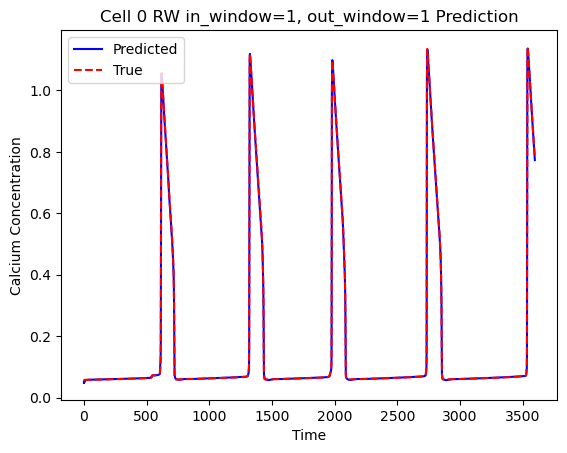

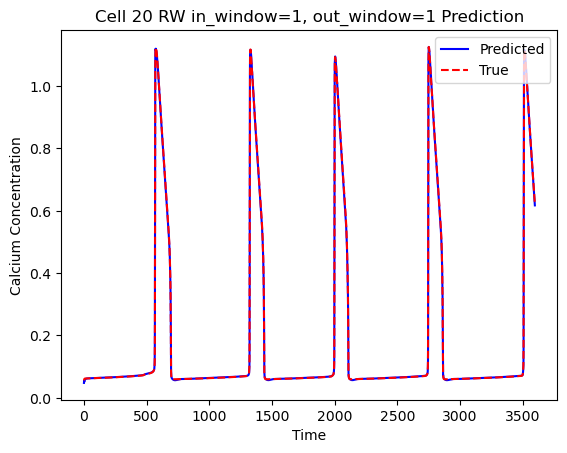

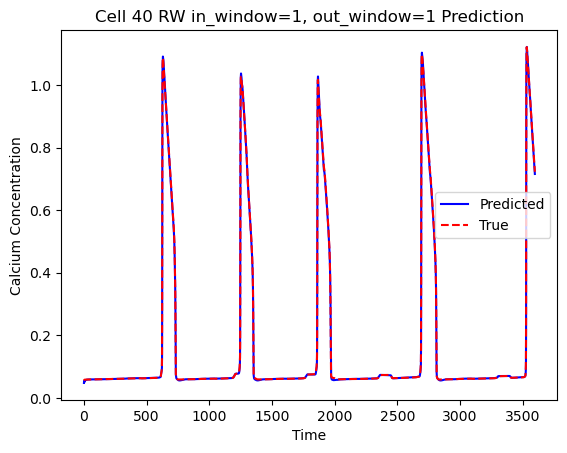

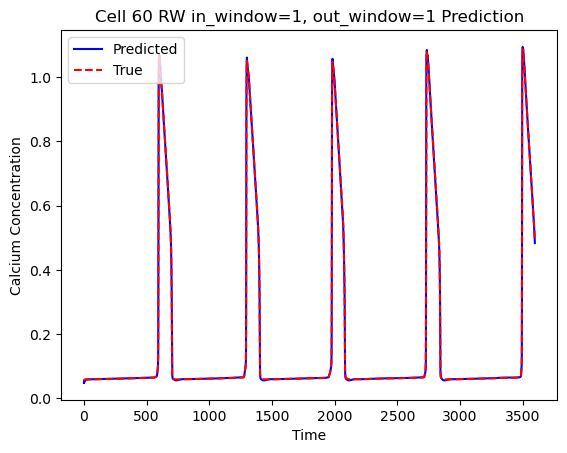

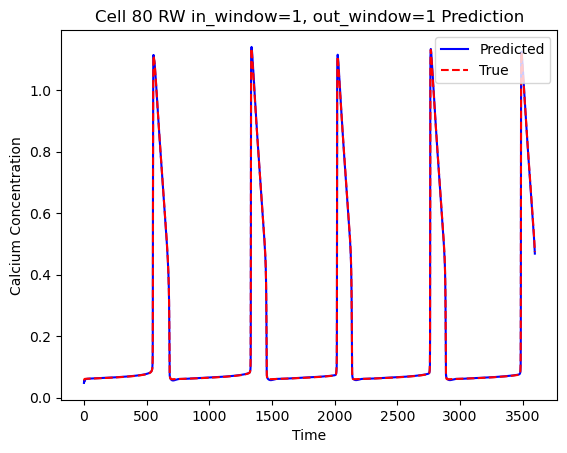

...

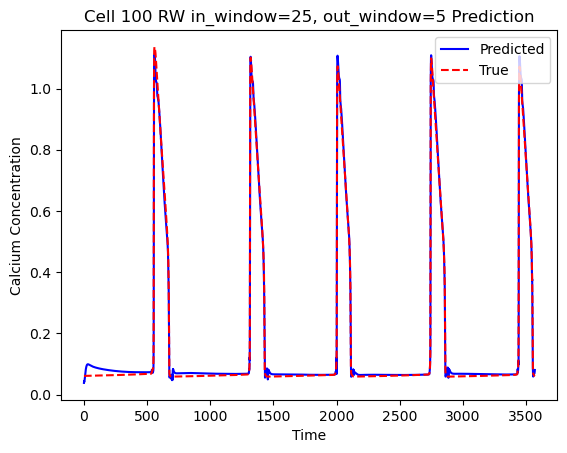

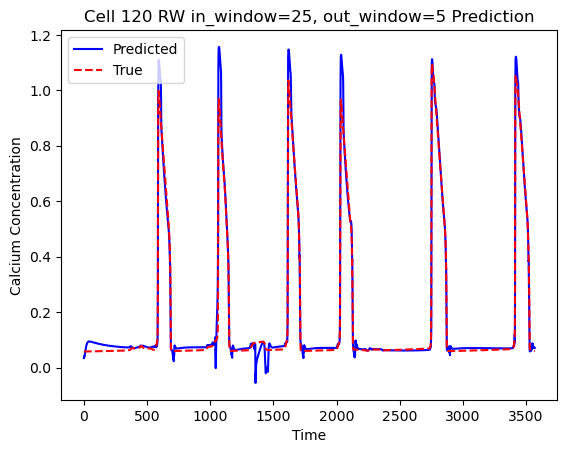

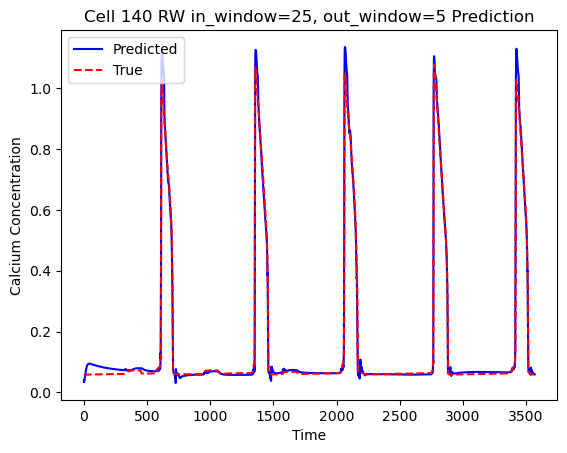

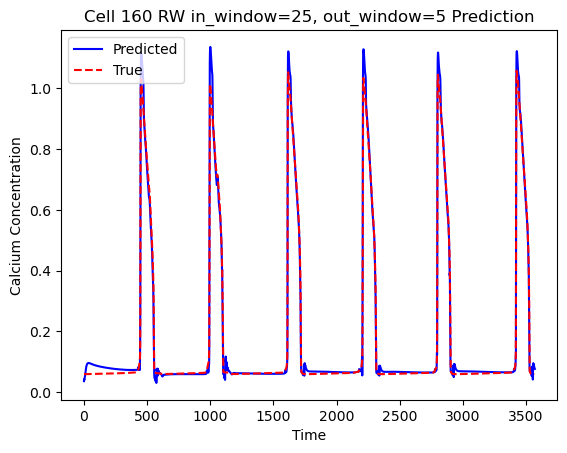

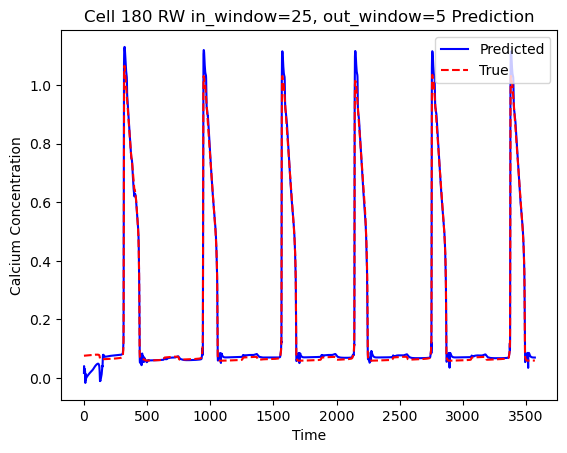

In [13]:
import matplotlib.pyplot as plt
# Plot the preds vs truths for the each trained model
for (in_w, out_w), res in results.items():
    RW_preds_arr_loop = res['preds']
    RW_truths_arr_loop = res['truths']

    cell_indices = testing_set[0].x.shape[0]  # All cell indices
    for i in range(cell_indices):
        if i % 20 != 0:
            continue  # Plot every 10th cell to reduce number of plots

        plt.figure()
        plt.plot(RW_preds_arr_loop[i, :, 0], label='Predicted', color='b')
        plt.plot(RW_truths_arr_loop[i, :, 0], label='True', color='r', linestyle='--')
        plt.title(f'Cell {i} RW in_window={in_w}, out_window={out_w} Prediction')
        plt.xlabel('Time')
        plt.ylabel('Calcium Concentration')
        plt.legend()
        plt.show()

In [14]:
# Now evaluate models on autoregressive rollouts
for (in_w, out_w), res in results.items():
    model = res['model']
    RW_testing_dataset = SlidingWindowTemporalDataset(
        Ca=testing_set.Ca.numpy(),
        edge_index=testing_set.edge_index,
        in_window=in_w,
        horizon=1,
        out_window=out_w
    )

    # Use the first window as initial input
    first_data = RW_testing_dataset.get(0)
    x0 = first_data.x  # (N, in_window)
    edge_index = first_data.edge_index

    # Perform autoregressive rollout
    steps = 200  # Number of steps to rollout
    rollout_preds = autoregressive_rollout_RW(model, x0, edge_index, steps=steps)

    # Store rollout predictions
    res['rollout_preds'] = rollout_preds  # Shape: (steps+1, N, out_window)

    print(f"Completed autoregressive rollout for in_window={in_w}, out_window={out_w}.")

Completed autoregressive rollout for in_window=1, out_window=1.
Completed autoregressive rollout for in_window=5, out_window=5.
Completed autoregressive rollout for in_window=10, out_window=10.
Completed autoregressive rollout for in_window=5, out_window=1.
Completed autoregressive rollout for in_window=10, out_window=1.
Completed autoregressive rollout for in_window=25, out_window=5.


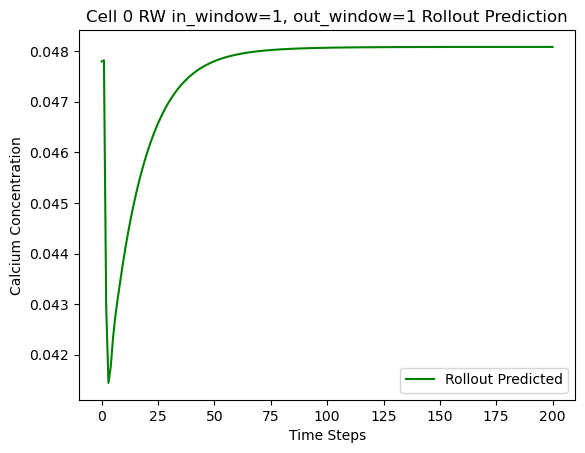

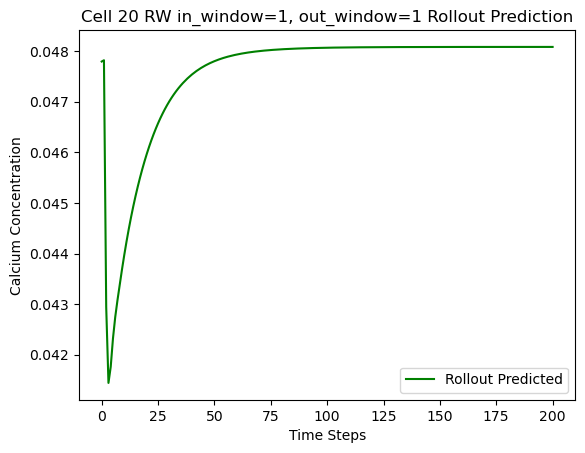

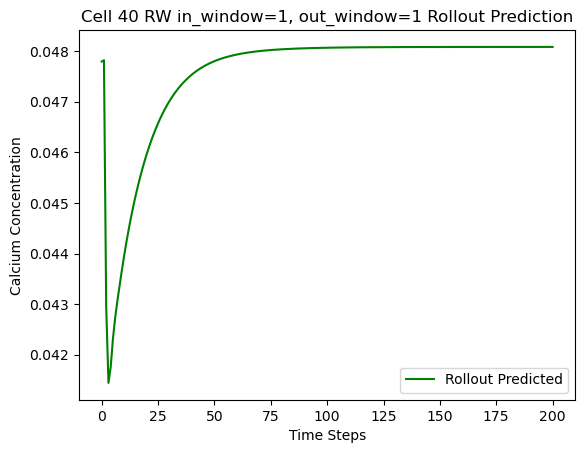

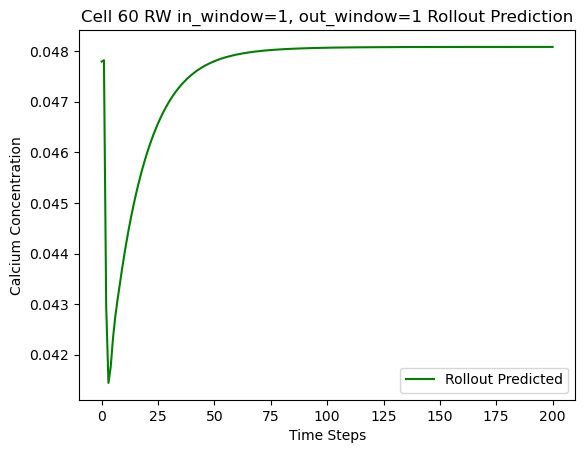

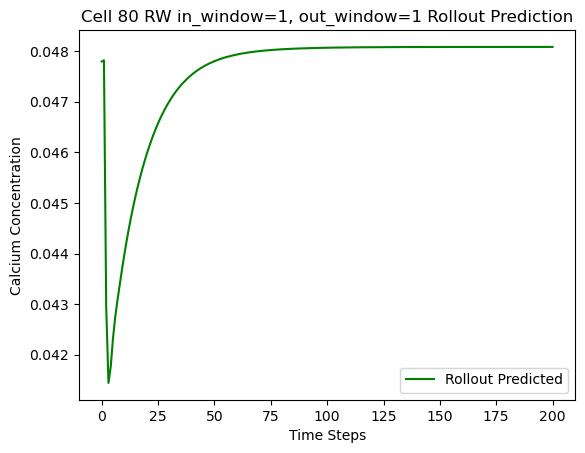

...

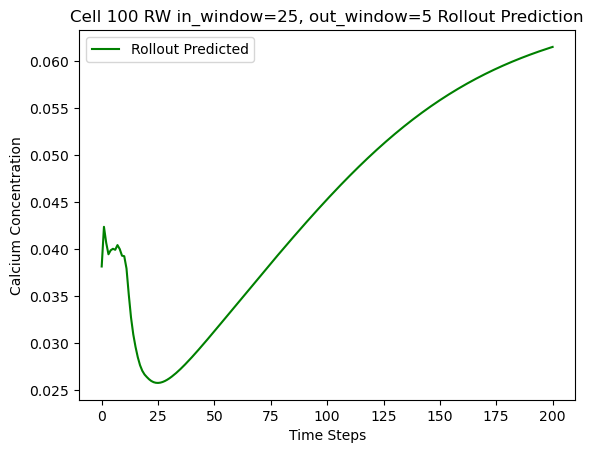

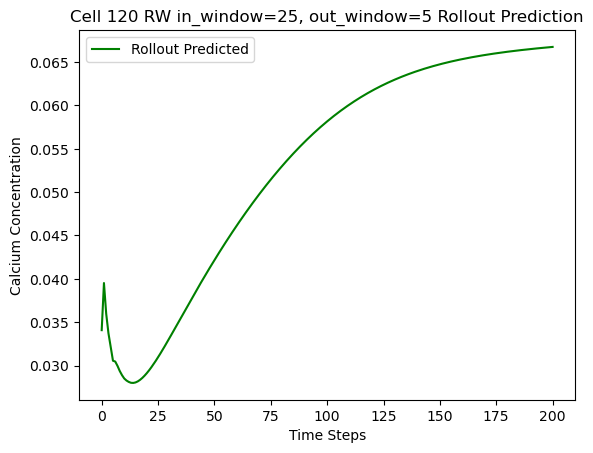

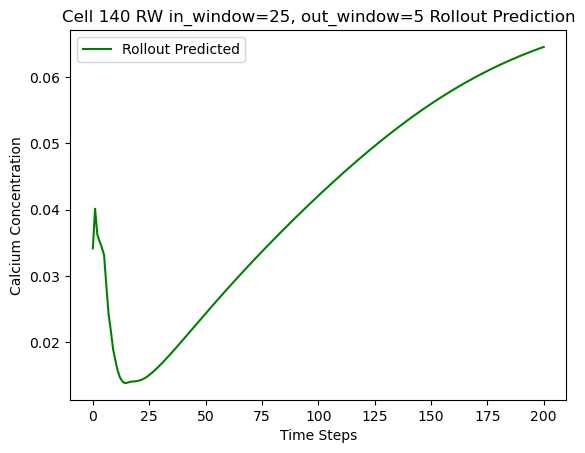

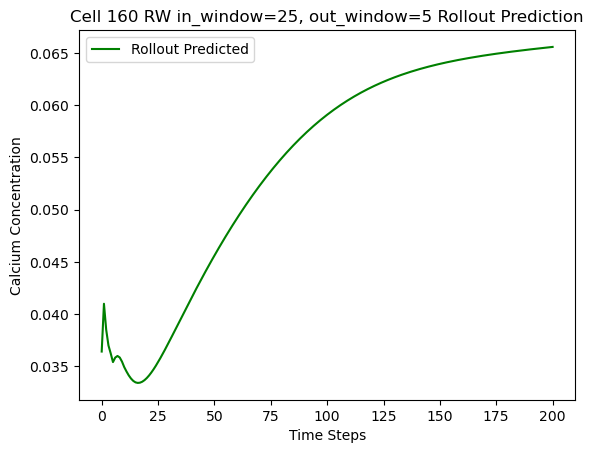

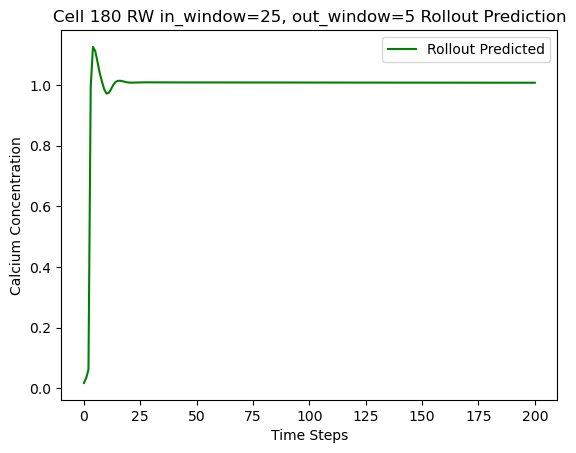

In [15]:
# Plot rollout results for a few cells
for (in_w, out_w), res in results.items():
    rollout_preds = res['rollout_preds']  # (steps+1, N, out_window)

    cell_indices = testing_set[0].x.shape[0]  # All cell indices
    for i in range(cell_indices):
        if i % 20 != 0:
            continue  # Plot every 10th cell to reduce number of plots

        plt.figure()
        plt.plot(rollout_preds[:, i, 0], label='Rollout Predicted', color='g')
        plt.title(f'Cell {i} RW in_window={in_w}, out_window={out_w} Rollout Prediction')
        plt.xlabel('Time Steps')
        plt.ylabel('Calcium Concentration')
        plt.legend()
        plt.show()

In [16]:
# Repeat in loop with bigger rolling windows and store results
in_window_sizes = [1, 5, 10, 5, 10, 25]
out_window_sizes = [1, 5, 10, 1, 1, 5]

training_set = files_111[1]
testing_set = files_111[10]

results = {}
for in_w, out_w in zip(in_window_sizes, out_window_sizes):
    print(f"Training rolling-window model with in_window={in_w}, out_window={out_w}")
    RW_training_dataset = SlidingWindowTemporalDataset(
        Ca=training_set.Ca.numpy(),
        edge_index=testing_set.edge_index,
        in_window=in_w,
        horizon=1,
        out_window=out_w
    )

    RW_testing_dataset = SlidingWindowTemporalDataset(
        Ca=testing_set.Ca.numpy(),
        edge_index=testing_set.edge_index,
        in_window=in_w,
        horizon=1,
        out_window=out_w
    )

    model_RW_loop = GCNConv_GRU_Autoregressive_RW(in_channels=in_w, hidden_channels=32, out_window=out_w)
    RW_MSE_loop, RW_L1_loop = train_model_RW_multi(model_RW_loop, RW_training_dataset, epochs=50, lr=1e-3)

    # Evaluate
    RW_preds_list_loop, RW_truths_list_loop = evaluate_nextstep_RW(model_RW_loop, RW_testing_dataset)

    # Convert to arrays
    RW_truths_arr_loop = torch.stack([t for t in RW_truths_list_loop], dim=1).numpy()  # (N, T_test, out_window)
    RW_preds_arr_loop  = torch.stack([p for p in RW_preds_list_loop],  dim=1).numpy()  # (N, T_test, out_window)

    results[(in_w, out_w)] = {
        'model': model_RW_loop,
        'MSE_loss': RW_MSE_loop,
        'L1_loss': RW_L1_loop,
        'preds': RW_preds_arr_loop,
        'truths': RW_truths_arr_loop
    }


Training rolling-window model with in_window=1, out_window=1
Epoch 0: MSELoss = 7.029597, L1Loss = 34.246891
Epoch 1: MSELoss = 5.373763, L1Loss = 21.863483
Epoch 2: MSELoss = 5.299717, L1Loss = 19.003235
Epoch 3: MSELoss = 5.275276, L1Loss = 19.187022
Epoch 4: MSELoss = 5.258092, L1Loss = 18.453341
Epoch 5: MSELoss = 5.302121, L1Loss = 18.382819
Epoch 6: MSELoss = 5.373128, L1Loss = 21.220749
Epoch 7: MSELoss = 5.465266, L1Loss = 20.289682
Epoch 8: MSELoss = 5.292068, L1Loss = 18.172560
Epoch 9: MSELoss = 5.308657, L1Loss = 18.760186
Epoch 10: MSELoss = 5.317208, L1Loss = 19.788203
Epoch 11: MSELoss = 5.307298, L1Loss = 19.103708
Epoch 12: MSELoss = 5.398493, L1Loss = 19.780385
Epoch 13: MSELoss = 5.420066, L1Loss = 19.756321
Epoch 14: MSELoss = 5.391755, L1Loss = 19.771258
Epoch 15: MSELoss = 5.406108, L1Loss = 19.520084
Epoch 16: MSELoss = 5.437742, L1Loss = 19.611013
Epoch 17: MSELoss = 5.408901, L1Loss = 20.146912
Epoch 18: MSELoss = 5.336536, L1Loss = 18.547682
Epoch 19: MSELoss 

In [20]:
# Compare results
for (in_w, out_w), res in results.items():
    print(f"Results for in_window={in_w}, out_window={out_w}:")
    print(f"  Final MSE Loss: {res['MSE_loss'][-1]:.6f}")
    print(f"  Final L1 Loss: {res['L1_loss'][-1]:.6f}")

Results for in_window=1, out_window=1:
  Final MSE Loss: 5.320028
  Final L1 Loss: 20.543282
Results for in_window=5, out_window=5:
  Final MSE Loss: 5.456433
  Final L1 Loss: 22.301017
Results for in_window=10, out_window=10:
  Final MSE Loss: 5.536352
  Final L1 Loss: 21.828868
Results for in_window=5, out_window=1:
  Final MSE Loss: 5.210076
  Final L1 Loss: 23.335880
Results for in_window=10, out_window=1:
  Final MSE Loss: 4.956261
  Final L1 Loss: 21.153680
Results for in_window=25, out_window=5:
  Final MSE Loss: 5.564096
  Final L1 Loss: 20.753137


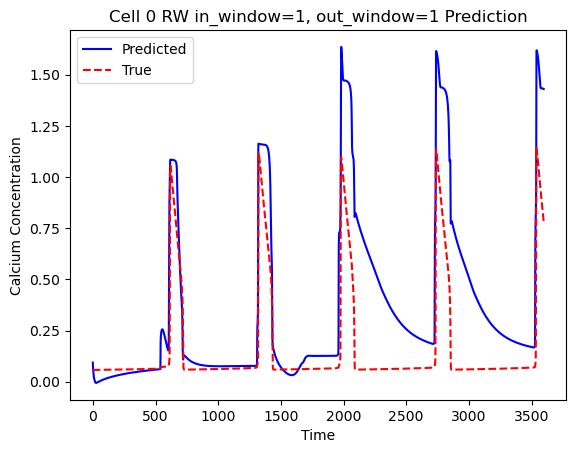

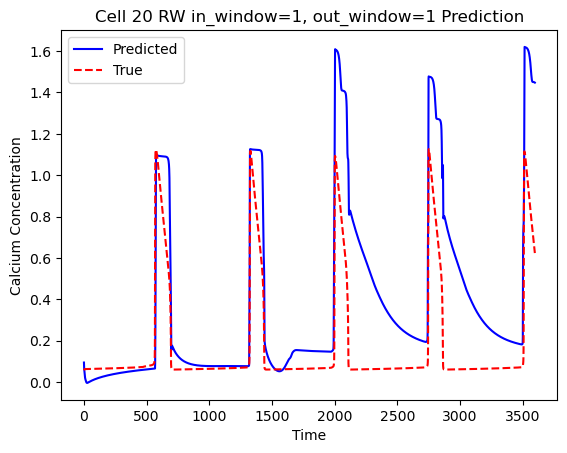

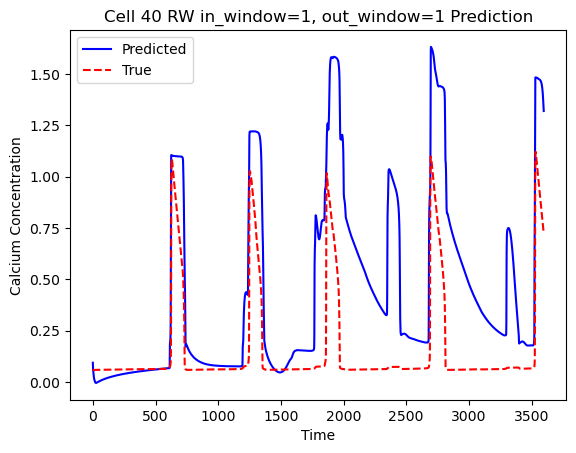

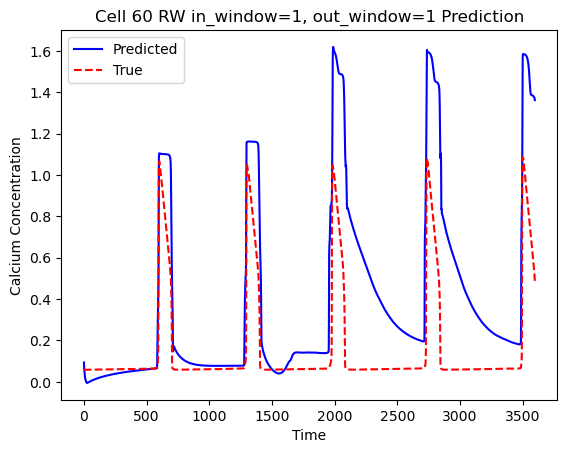

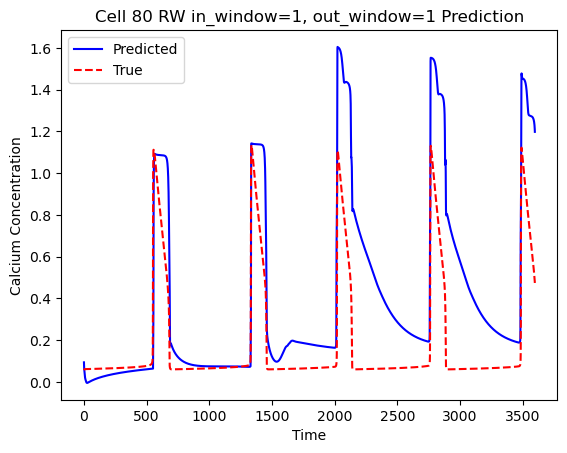

...

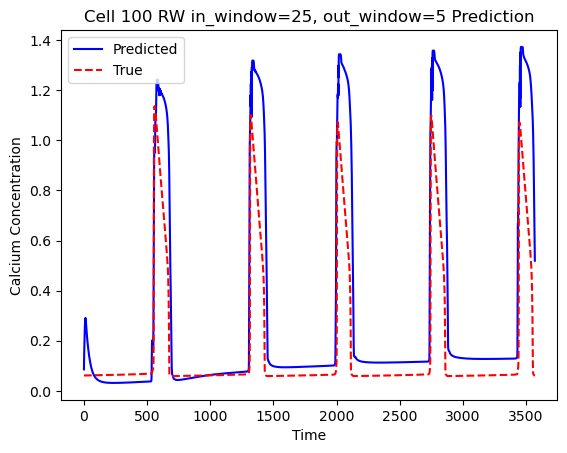

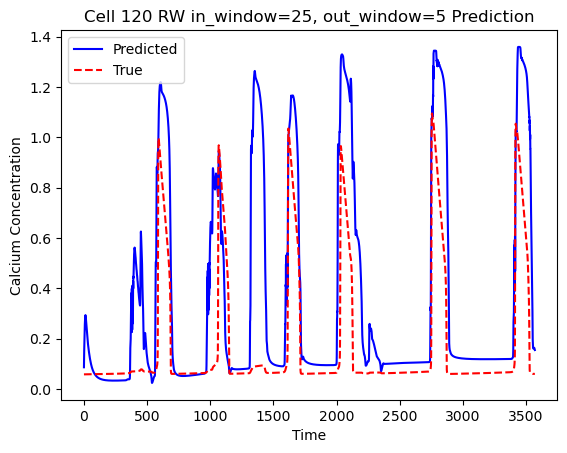

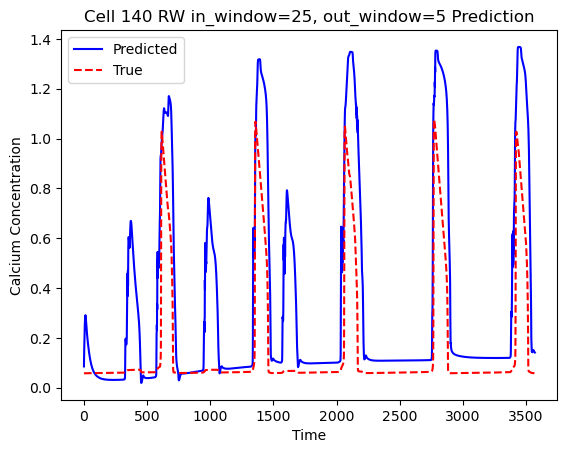

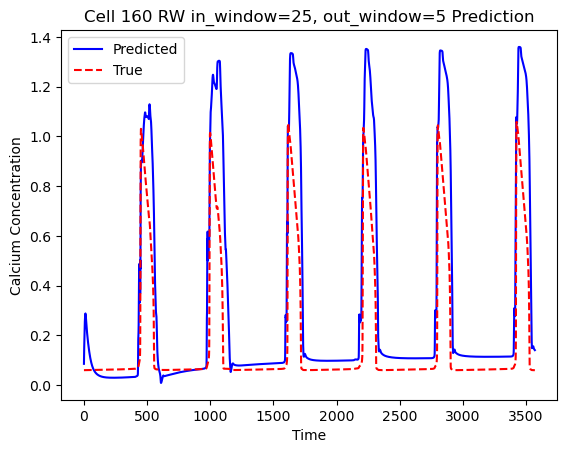

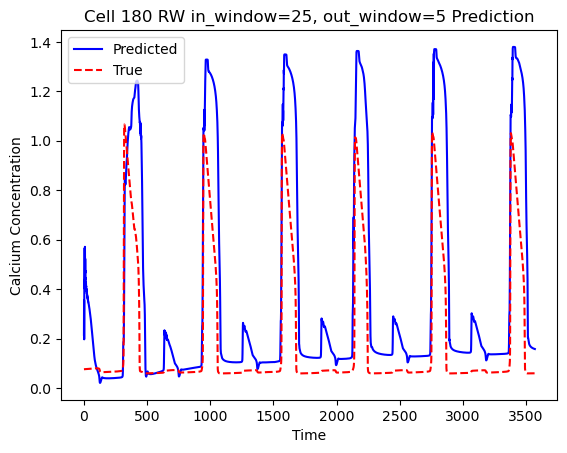

In [23]:
import matplotlib.pyplot as plt
# Plot the preds vs truths for the each trained model
for (in_w, out_w), res in results.items():
    RW_preds_arr_loop = res['preds']
    RW_truths_arr_loop = res['truths']

    cell_indices = testing_set[0].x.shape[0]  # All cell indices
    for i in range(cell_indices):
        if i % 20 != 0:
            continue  # Plot every 10th cell to reduce number of plots

        plt.figure()
        plt.plot(RW_preds_arr_loop[i, :, 0], label='Predicted', color='b')
        plt.plot(RW_truths_arr_loop[i, :, 0], label='True', color='r', linestyle='--')
        plt.title(f'Cell {i} RW in_window={in_w}, out_window={out_w} Prediction')
        plt.xlabel('Time')
        plt.ylabel('Calcium Concentration')
        plt.legend()
        plt.show()

In [17]:
# Now evaluate models on autoregressive rollouts
for (in_w, out_w), res in results.items():
    model = res['model']
    RW_testing_dataset = SlidingWindowTemporalDataset(
        Ca=testing_set.Ca.numpy(),
        edge_index=testing_set.edge_index,
        in_window=in_w,
        horizon=1,
        out_window=out_w
    )

    # Use the first window as initial input
    first_data = RW_testing_dataset.get(0)
    x0 = first_data.x  # (N, in_window)
    edge_index = first_data.edge_index

    # Perform autoregressive rollout
    steps = 200  # Number of steps to rollout
    rollout_preds = autoregressive_rollout_RW(model, x0, edge_index, steps=steps)

    # Store rollout predictions
    res['rollout_preds'] = rollout_preds  # Shape: (steps+1, N, out_window)

    print(f"Completed autoregressive rollout for in_window={in_w}, out_window={out_w}.")

Completed autoregressive rollout for in_window=1, out_window=1.
Completed autoregressive rollout for in_window=5, out_window=5.
Completed autoregressive rollout for in_window=10, out_window=10.
Completed autoregressive rollout for in_window=5, out_window=1.
Completed autoregressive rollout for in_window=10, out_window=1.
Completed autoregressive rollout for in_window=25, out_window=5.


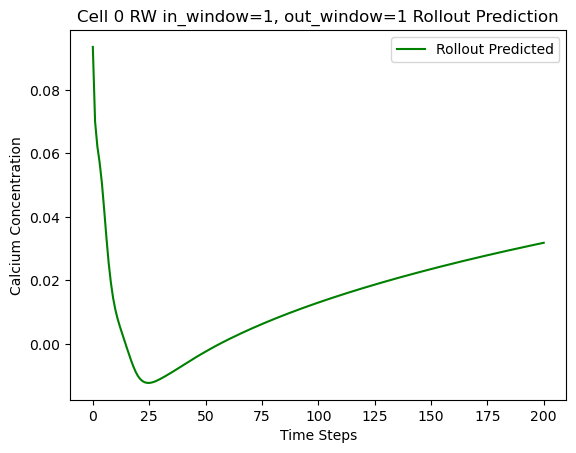

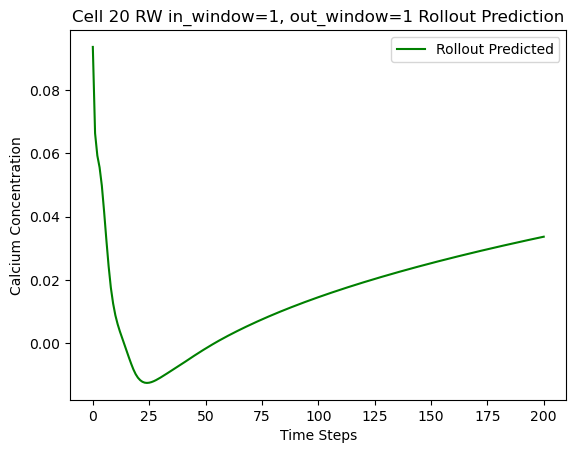

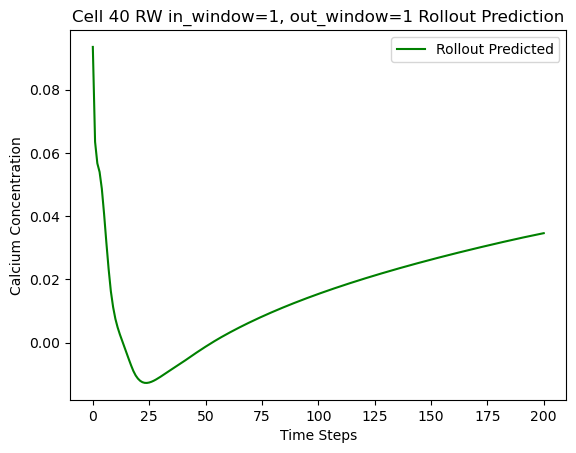

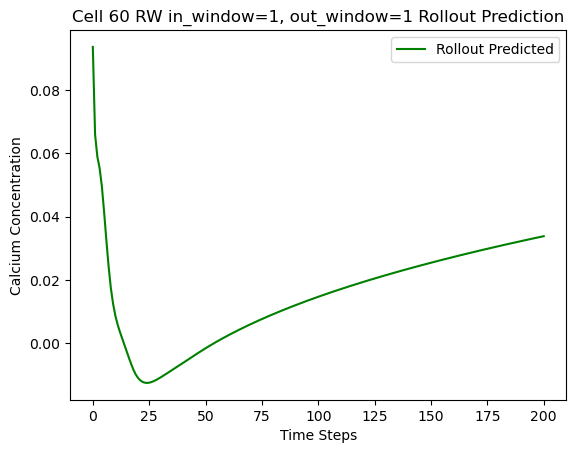

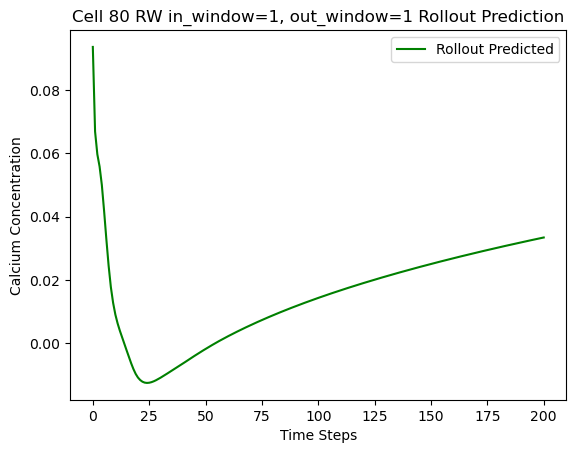

...

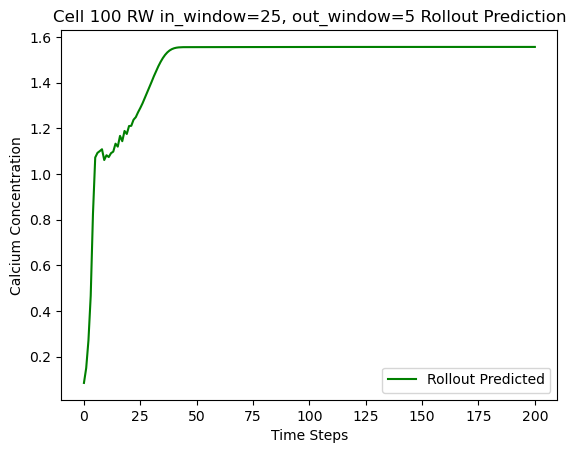

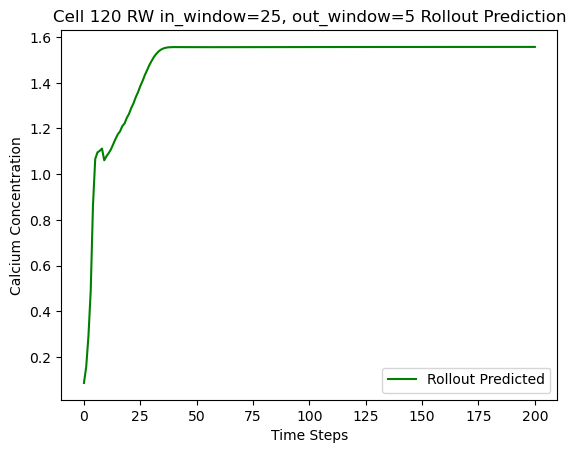

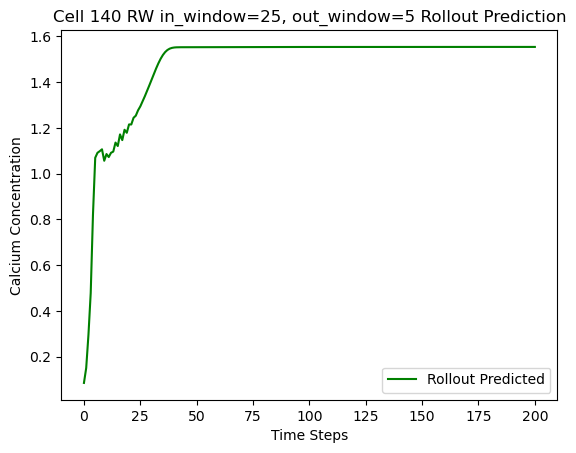

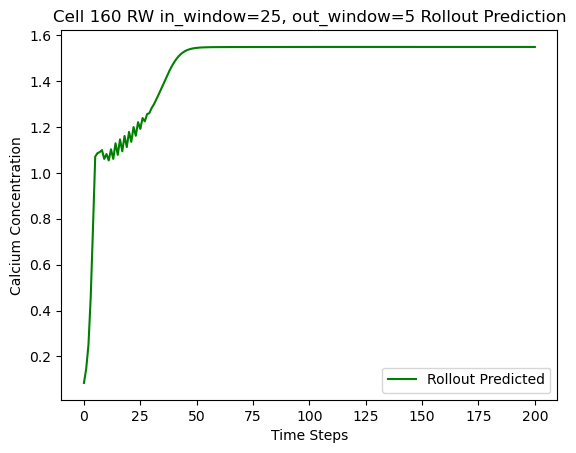

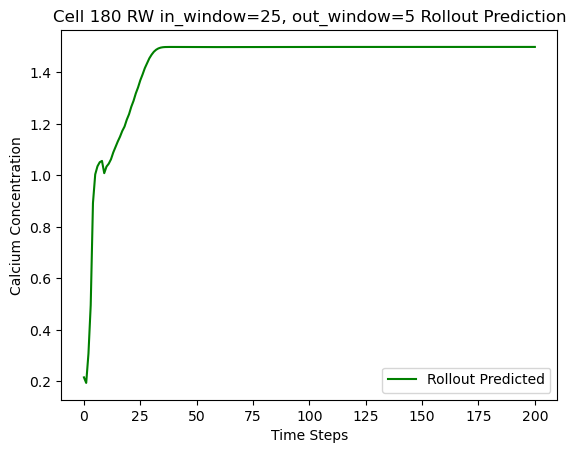

In [18]:
# Plot rollout results for a few cells
for (in_w, out_w), res in results.items():
    rollout_preds = res['rollout_preds']  # (steps+1, N, out_window)

    cell_indices = testing_set[0].x.shape[0]  # All cell indices
    for i in range(cell_indices):
        if i % 20 != 0:
            continue  # Plot every 10th cell to reduce number of plots

        plt.figure()
        plt.plot(rollout_preds[:, i, 0], label='Rollout Predicted', color='g')
        plt.title(f'Cell {i} RW in_window={in_w}, out_window={out_w} Rollout Prediction')
        plt.xlabel('Time Steps')
        plt.ylabel('Calcium Concentration')
        plt.legend()
        plt.show()